## Analiza Environmental data: Clustering

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d
from matplotlib.colors import ListedColormap
import seaborn as sns
import warnings

from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from scipy.spatial.distance import pdist
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.linear_model import LassoCV
from sklearn.decomposition import PCA

In [2]:
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.style.use('seaborn-v0_8-whitegrid')
%matplotlib widget

### Prvi korak - istraživanje podataka

In [3]:
data = pd.read_csv("environment_data.csv")

In [4]:
data.columns

Index(['timestamp', 'sound', 'pressure', 'temp', 'humidity', 'voc', 'pm1.0',
       'pm2.5', 'pm10', 'CO2'],
      dtype='object')

In [5]:
data['timestamp'] = pd.to_datetime(data['timestamp'])
data.set_index('timestamp', inplace=True)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 345151 entries, 2022-11-07 00:00:01 to 2022-11-10 23:59:59
Data columns (total 9 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   sound     345151 non-null  float64
 1   pressure  345151 non-null  float64
 2   temp      345151 non-null  float64
 3   humidity  345151 non-null  float64
 4   voc       345151 non-null  float64
 5   pm1.0     345151 non-null  float64
 6   pm2.5     345151 non-null  float64
 7   pm10      345151 non-null  float64
 8   CO2       344264 non-null  float64
dtypes: float64(9)
memory usage: 26.3 MB


In [7]:
data.head()

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
timestamp,,,,,,,,,
2022-11-07 00:00:01,0.881076,1012.037290,24.777757,35.996349,29466.0,26.0,36.0,45.0,421.0
2022-11-07 00:00:02,0.863325,1012.025698,24.762371,36.002125,29467.0,26.0,36.0,45.0,419.0
2022-11-07 00:00:03,0.908509,1012.083523,24.767500,36.013384,29459.0,26.0,36.0,45.0,418.0
2022-11-07 00:00:04,0.924645,1012.091207,24.767500,36.013384,29454.0,26.0,36.0,44.0,418.0
2022-11-07 00:00:05,0.896406,1012.091207,24.764935,36.013405,29458.5,26.0,36.0,44.0,416.0


In [8]:
data.tail()

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
timestamp,,,,,,,,,
2022-11-10 23:59:55,1.045672,1023.909475,25.752187,34.016978,29363.0,31.0,45.0,56.0,467.0
2022-11-10 23:59:56,1.042445,1023.909475,25.747058,34.022710,29374.0,31.0,45.0,56.0,467.0
2022-11-10 23:59:57,1.110220,1023.901703,25.736801,34.022842,29379.0,31.0,45.0,56.0,467.0
2022-11-10 23:59:58,1.046479,1023.878387,25.729108,34.054104,29372.5,30.5,44.5,55.5,468.0
2022-11-10 23:59:59,1.131198,1023.905394,25.726544,34.045638,29359.0,30.0,44.0,55.0,470.0


In [9]:
data.describe()

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
count,345151.000000,345151.000000,345151.000000,345151.000000,345151.000000,345151.000000,345151.000000,345151.000000,344264.000000
mean,1.035109,1014.807431,25.123033,34.636160,30512.354483,49.980410,68.674444,79.883421,442.465660
std,0.493434,2.517912,1.210600,2.652997,1329.625356,27.035828,31.107893,30.668957,28.831611
min,0.000000,1005.339453,20.326285,26.962989,28427.000000,20.000000,30.000000,33.000000,400.000000
25%,0.931100,1013.215952,24.470044,32.984199,29458.000000,33.000000,48.000000,61.000000,418.000000
50%,1.035990,1014.020586,24.972642,34.628268,29964.500000,38.000000,54.000000,68.000000,440.000000
75%,1.229633,1015.415069,25.782958,36.830740,31443.000000,59.000000,85.000000,93.000000,462.000000
max,3.303227,1024.071917,28.293446,41.651724,34535.000000,270.500000,279.500000,428.000000,562.000000


In [10]:
data.var()

sound       2.434773e-01
pressure    6.339881e+00
temp        1.465552e+00
humidity    7.038394e+00
voc         1.767904e+06
pm1.0       7.309360e+02
pm2.5       9.677010e+02
pm10        9.405849e+02
CO2         8.312618e+02
dtype: float64

In [11]:
data.skew()

sound       0.390953
pressure    1.944262
temp        0.120681
humidity   -0.323284
voc         0.762294
pm1.0       1.698947
pm2.5       1.425518
pm10        1.516714
CO2         0.526927
dtype: float64

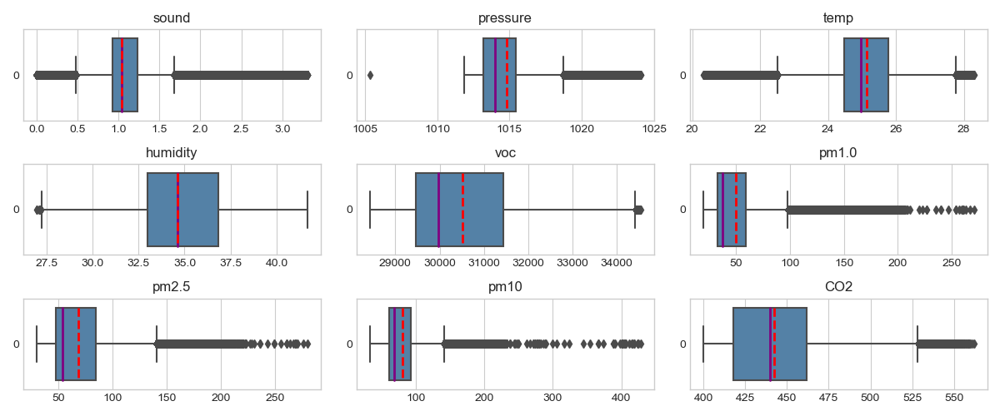

In [12]:
plt.figure(figsize=(12, 5))
for i, feature in enumerate(list(data.columns)):
    plt.subplot(3, 3, i+1)
    plt.title(feature)
    sns.boxplot(data[feature], orient='h', color="steelblue", showmeans=True, meanline=True,
                    medianprops={'linewidth': 2, 'color': 'purple'},
                    meanprops={'linewidth': 2, 'color': 'red'})
plt.tight_layout()

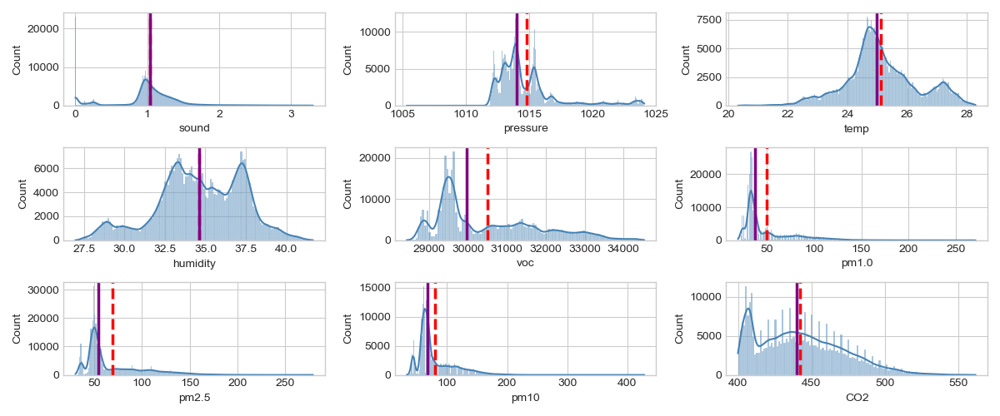

In [13]:
plt.figure(figsize=(12, 5))
for i, feature in enumerate(list(data.columns)):
    plt.subplot(3, 3, i+1)
    sns.histplot(data[feature], kde=True, color="steelblue")
    plt.axvline(x=data[feature].mean(), c='red', ls='--', lw=2.5)
    plt.axvline(x=data[feature].median(), c='purple', ls='-', lw=2.5)
plt.tight_layout()

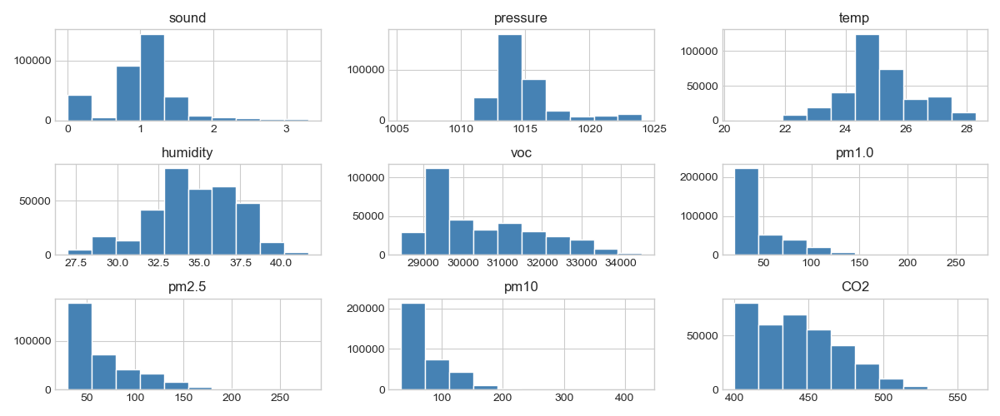

In [14]:
data.hist(figsize=(12, 5), color="steelblue")
plt.tight_layout()

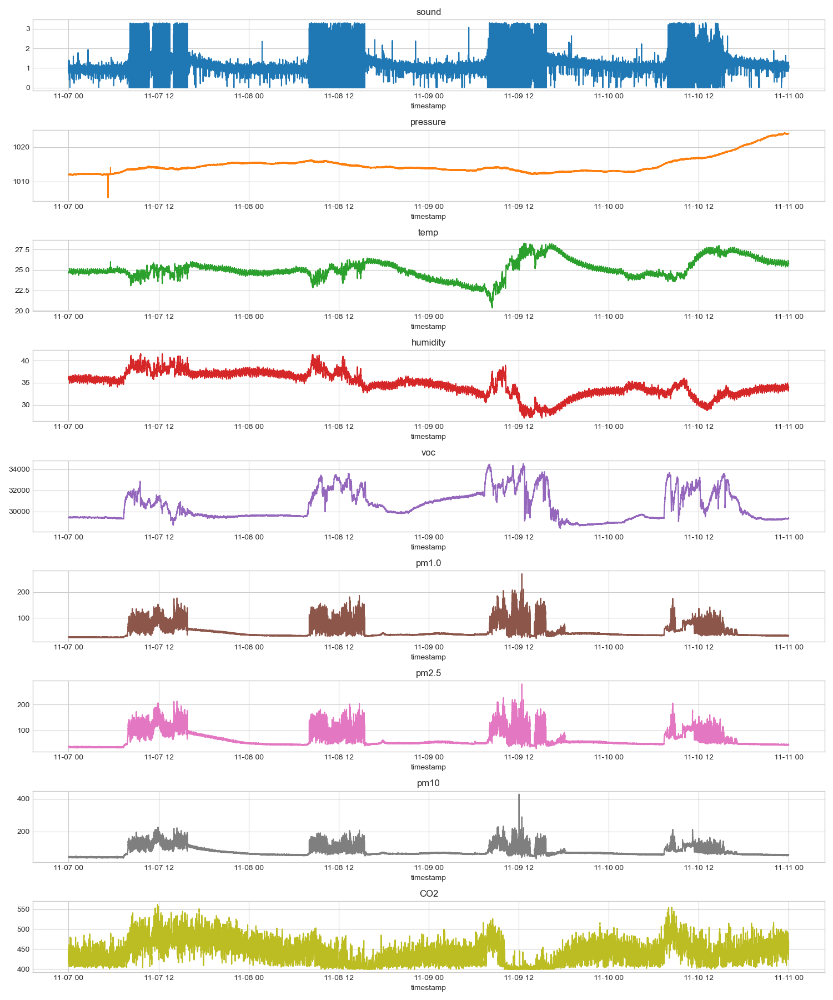

In [15]:
data.plot(figsize=(15, 18), subplots=True, sharex=False, legend=False, title=list(data.columns))
plt.tight_layout()

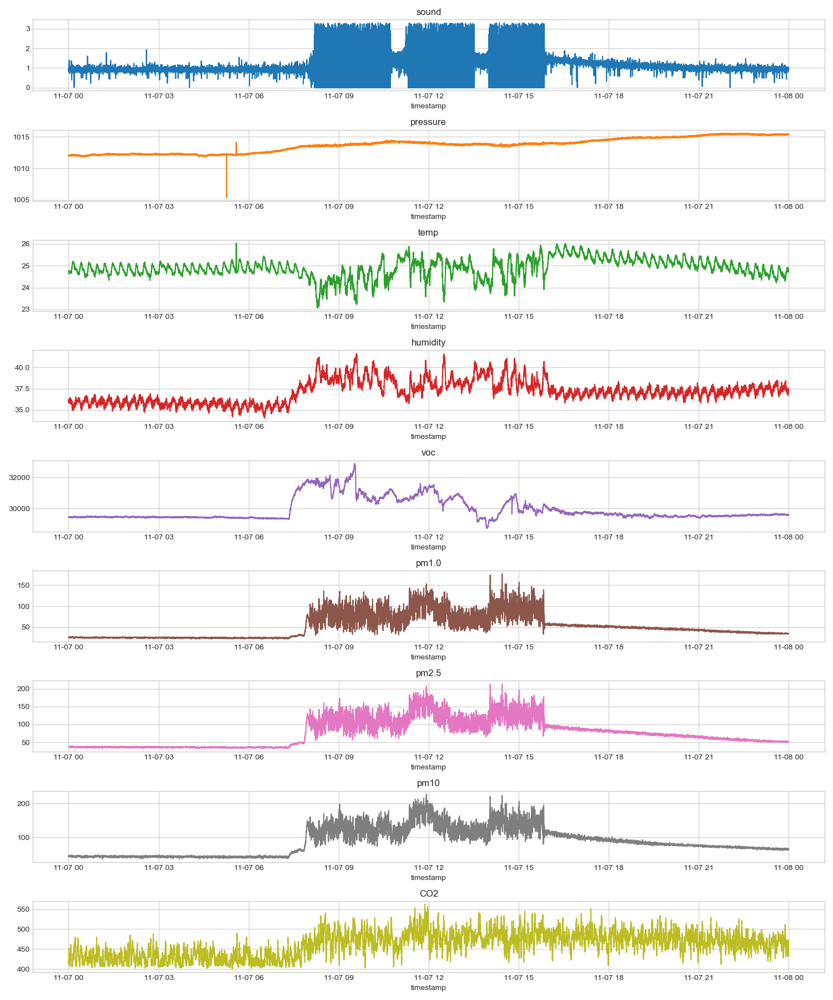

In [16]:
data[:86400].plot(figsize=(15, 18), subplots=True, sharex=False, legend=False, title=list(data.columns))
plt.tight_layout()

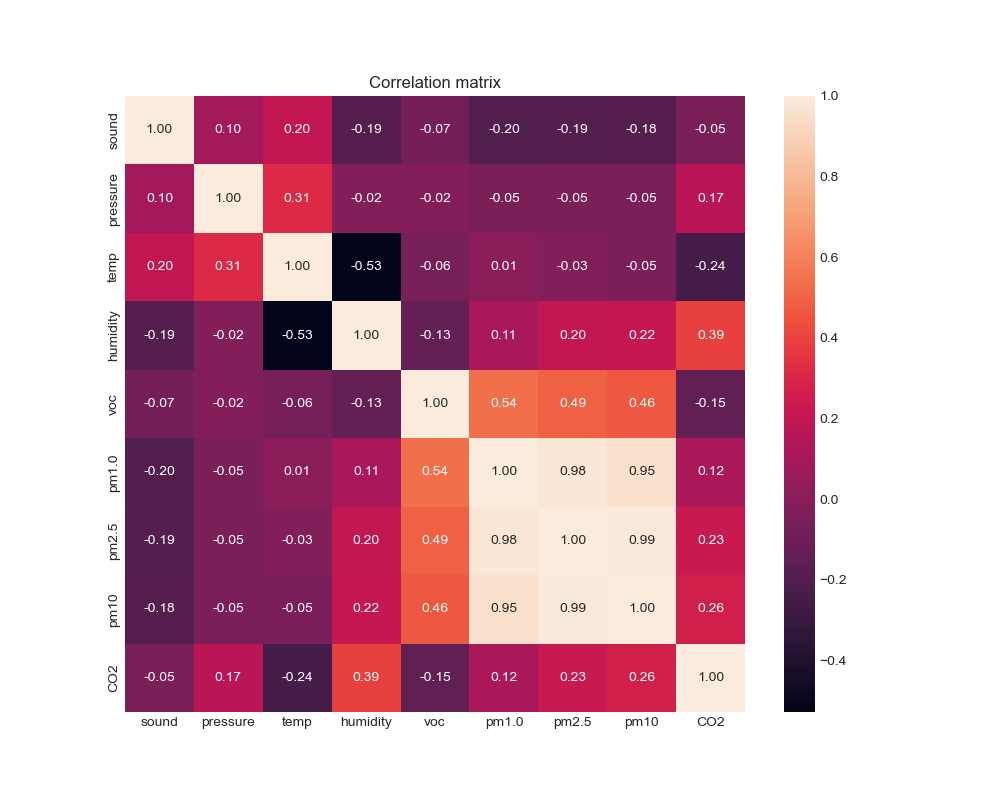

In [17]:
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, fmt='.2f')
plt.title("Correlation matrix")
plt.show()

### Drugi korak - preprocesiranje podataka

In [18]:
print(f"Number of NaN values in dataset:\n{data.isna().sum()}")

Number of NaN values in dataset:
sound         0
pressure      0
temp          0
humidity      0
voc           0
pm1.0         0
pm2.5         0
pm10          0
CO2         887
dtype: int64


In [19]:
imputer = SimpleImputer(strategy="mean")
data[['CO2']] = imputer.fit_transform(data[['CO2']])

In [20]:
print(f"Number of NaN values in dataset:\n{data.isna().sum()}")

Number of NaN values in dataset:
sound       0
pressure    0
temp        0
humidity    0
voc         0
pm1.0       0
pm2.5       0
pm10        0
CO2         0
dtype: int64


In [21]:
print(f"Number of duplicates in dataset: {data.duplicated().sum()}")

Number of duplicates in dataset: 0


In [22]:
print(f"Number of index duplicates in dataset: {data.index.duplicated().sum()}")

Number of index duplicates in dataset: 24


In [23]:
data[data.index.duplicated()]

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
timestamp,,,,,,,,,
2022-11-07 01:00:00,0.927873,1012.029181,24.885456,35.769386,29454.0,25.0,36.0,44.0,449.0
2022-11-07 05:00:00,0.929487,1012.083651,24.726471,35.821613,29466.0,26.0,37.0,45.0,408.0
2022-11-07 09:00:00,0.731002,1013.577997,24.454659,38.499439,31630.0,69.0,103.0,119.0,487.0
2022-11-07 10:00:00,1.844450,1013.874410,24.449530,38.928240,30666.0,94.0,126.0,139.0,487.0
2022-11-07 11:00:00,1.591100,1014.204036,25.552171,36.589889,30518.0,46.0,78.0,92.0,436.0
2022-11-07 16:00:00,1.391002,1013.957464,25.500885,37.518162,29939.0,57.0,97.0,121.0,496.0
2022-11-08 04:00:00,0.874621,1015.260768,24.695700,37.036374,29647.0,32.0,47.0,59.0,439.0
2022-11-08 05:00:00,1.032763,1015.392091,25.167527,36.219366,29643.0,32.0,46.0,58.0,408.0
2022-11-08 07:00:00,0.916577,1015.672999,24.782885,36.691268,29551.0,31.0,46.0,57.0,425.0


In [24]:
data = data[~data.index.duplicated(keep='first')]

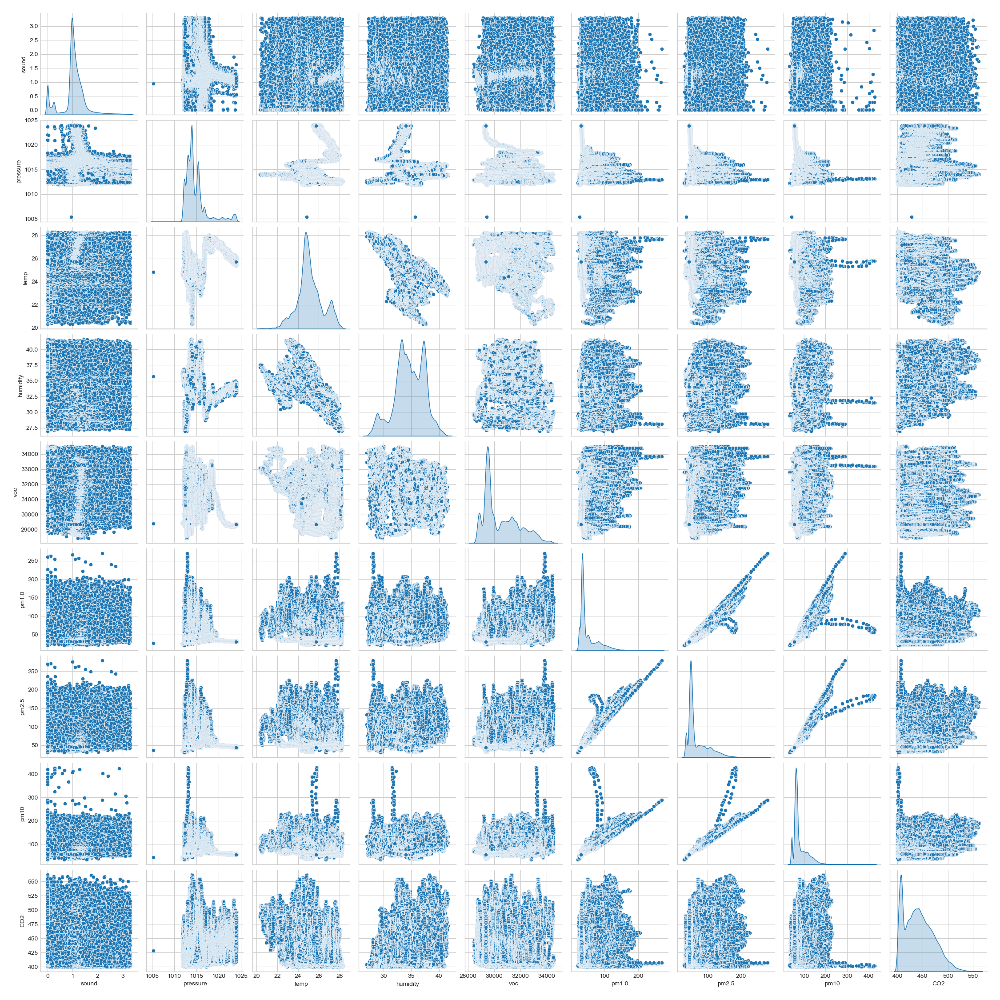

In [25]:
sns.pairplot(data, diag_kind="kde")
plt.show()

In [26]:
data.resample('s').interpolate().reset_index()

,timestamp,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
0,2022-11-07 00:00:01,0.881076,1012.037290,24.777757,35.996349,29466.0,26.0,36.0,45.0,421.0
1,2022-11-07 00:00:02,0.863325,1012.025698,24.762371,36.002125,29467.0,26.0,36.0,45.0,419.0
2,2022-11-07 00:00:03,0.908509,1012.083523,24.767500,36.013384,29459.0,26.0,36.0,45.0,418.0
3,2022-11-07 00:00:04,0.924645,1012.091207,24.767500,36.013384,29454.0,26.0,36.0,44.0,418.0
4,2022-11-07 00:00:05,0.896406,1012.091207,24.764935,36.013405,29458.5,26.0,36.0,44.0,416.0
...,...,...,...,...,...,...,...,...,...,...
345594,2022-11-10 23:59:55,1.045672,1023.909475,25.752187,34.016978,29363.0,31.0,45.0,56.0,467.0
345595,2022-11-10 23:59:56,1.042445,1023.909475,25.747058,34.022710,29374.0,31.0,45.0,56.0,467.0
345596,2022-11-10 23:59:57,1.110220,1023.901703,25.736801,34.022842,29379.0,31.0,45.0,56.0,467.0
345597,2022-11-10 23:59:58,1.046479,1023.878387,25.729108,34.054104,29372.5,30.5,44.5,55.5,468.0


In [27]:
data.resample('30s').interpolate().reset_index()

,timestamp,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
0,2022-11-07 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-11-07 00:00:30,0.956112,1012.062426,24.739293,36.041862,29462.5,25.0,36.0,45.0,421.5
2,2022-11-07 00:01:00,0.964988,1011.991563,24.623900,36.195291,29463.0,26.0,38.0,47.0,440.0
3,2022-11-07 00:01:30,0.995648,1012.033767,24.670057,36.177992,29451.0,27.0,38.0,45.0,419.0
4,2022-11-07 00:02:00,0.914963,1012.072187,24.711086,36.149430,29450.0,26.0,37.0,47.0,435.0
...,...,...,...,...,...,...,...,...,...,...
11515,2022-11-10 23:57:30,1.106993,1023.900574,26.003489,33.594159,29354.0,32.0,46.0,56.0,441.0
11516,2022-11-10 23:58:00,1.086015,1023.942064,25.906045,33.742903,29367.0,30.0,44.0,54.0,470.0
11517,2022-11-10 23:58:30,1.086015,1023.956866,25.854759,33.873960,29362.0,32.0,46.0,57.0,451.0
11518,2022-11-10 23:59:00,1.071491,1023.875457,25.808601,33.953912,29359.0,31.0,46.0,57.0,448.0


In [28]:
data_1s = data.resample('s').interpolate().reset_index()
data_1s['timestamp'] = pd.to_datetime(data_1s['timestamp'])
data_1s.set_index('timestamp', inplace=True)

data_30s = data.resample('30s').interpolate().reset_index().dropna()
data_30s.reset_index(drop=True, inplace=True)
data_30s['timestamp'] = pd.to_datetime(data_30s['timestamp'])
data_30s.set_index('timestamp', inplace=True)

In [29]:
data_1s.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 345599 entries, 2022-11-07 00:00:01 to 2022-11-10 23:59:59
Data columns (total 9 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   sound     345599 non-null  float64
 1   pressure  345599 non-null  float64
 2   temp      345599 non-null  float64
 3   humidity  345599 non-null  float64
 4   voc       345599 non-null  float64
 5   pm1.0     345599 non-null  float64
 6   pm2.5     345599 non-null  float64
 7   pm10      345599 non-null  float64
 8   CO2       345599 non-null  float64
dtypes: float64(9)
memory usage: 26.4 MB


In [30]:
data_1s.head()

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
timestamp,,,,,,,,,
2022-11-07 00:00:01,0.881076,1012.037290,24.777757,35.996349,29466.0,26.0,36.0,45.0,421.0
2022-11-07 00:00:02,0.863325,1012.025698,24.762371,36.002125,29467.0,26.0,36.0,45.0,419.0
2022-11-07 00:00:03,0.908509,1012.083523,24.767500,36.013384,29459.0,26.0,36.0,45.0,418.0
2022-11-07 00:00:04,0.924645,1012.091207,24.767500,36.013384,29454.0,26.0,36.0,44.0,418.0
2022-11-07 00:00:05,0.896406,1012.091207,24.764935,36.013405,29458.5,26.0,36.0,44.0,416.0


In [31]:
data_30s.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 11519 entries, 2022-11-07 00:00:30 to 2022-11-10 23:59:30
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   sound     11519 non-null  float64
 1   pressure  11519 non-null  float64
 2   temp      11519 non-null  float64
 3   humidity  11519 non-null  float64
 4   voc       11519 non-null  float64
 5   pm1.0     11519 non-null  float64
 6   pm2.5     11519 non-null  float64
 7   pm10      11519 non-null  float64
 8   CO2       11519 non-null  float64
dtypes: float64(9)
memory usage: 899.9 KB


In [32]:
data_30s.head()

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
timestamp,,,,,,,,,
2022-11-07 00:00:30,0.956112,1012.062426,24.739293,36.041862,29462.5,25.0,36.0,45.0,421.5
2022-11-07 00:01:00,0.964988,1011.991563,24.623900,36.195291,29463.0,26.0,38.0,47.0,440.0
2022-11-07 00:01:30,0.995648,1012.033767,24.670057,36.177992,29451.0,27.0,38.0,45.0,419.0
2022-11-07 00:02:00,0.914963,1012.072187,24.711086,36.149430,29450.0,26.0,37.0,47.0,435.0
2022-11-07 00:02:30,0.935941,1012.041327,24.741857,36.115291,29450.0,25.0,37.0,44.0,408.0


In [33]:
scaler_1s = StandardScaler()
scaled_data_1s = scaler_1s.fit_transform(data_1s)
scaled_data_df_1s = pd.DataFrame(scaled_data_1s, columns=data_1s.columns, index=data_1s.index)

In [34]:
scaler_30s = StandardScaler()
scaled_data_30s = scaler_30s.fit_transform(data_30s)
scaled_data_df_30s = pd.DataFrame(scaled_data_30s, columns=data_30s.columns, index=data_30s.index)

### Treći korak - primena hijerarhijskog klasterovanja

In [36]:
def create_dendrogram(linkage, metric, method):
    plt.figure(figsize=(15, 6))
    dendrogram(linkage)
    plt.title(f"Dendrogram - method: {method}, metric: {metric}")
    plt.xlabel('Sample index')
    plt.ylabel('Distance')
    plt.show()

In [37]:
def evaluate_linkage(data, metric, linkage_methods):
    coph_correlations = {}
    linkages = {}
    res = {}

    for method in linkage_methods:
        z = linkage(data, metric=metric, method=method)
        c, coph_distances = cophenet(z, pdist(data, metric=metric))
        coph_correlations[method] = c
        linkages[method] = z

        create_dendrogram(z, metric, method)

    res["coph_correlations"] = coph_correlations
    res["linkages"] = linkages

    return res

In [134]:
linkage_methods = ["single", "complete", "average", "weighted", "centroid", "median", "ward"]

In [135]:
euclidean_res = evaluate_linkage(scaled_data_df_1s, "euclidean", linkage_methods)

MemoryError: Unable to allocate 445. GiB for an array with shape (59719161601,) and data type float64

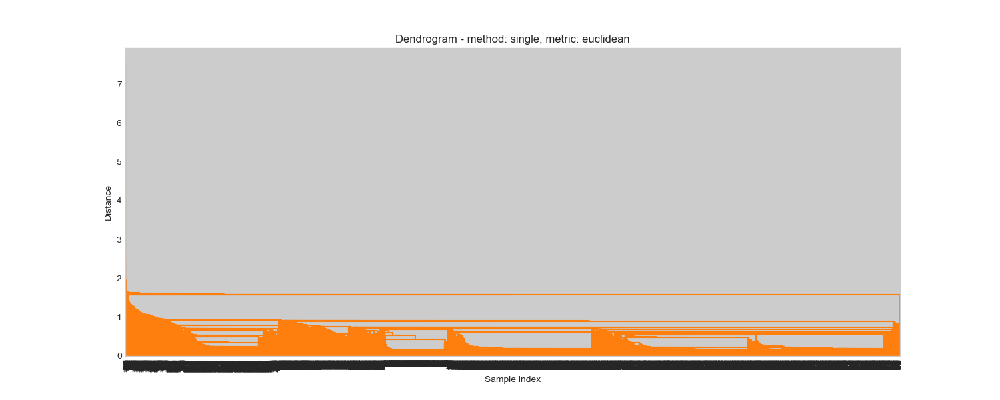

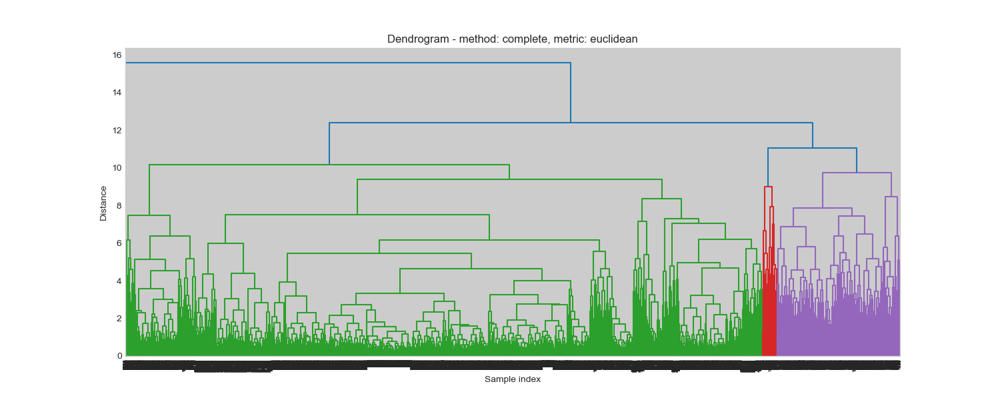

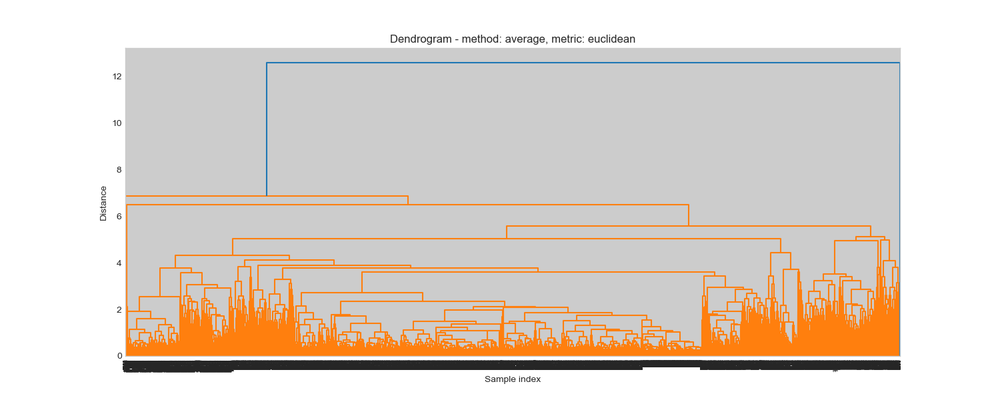

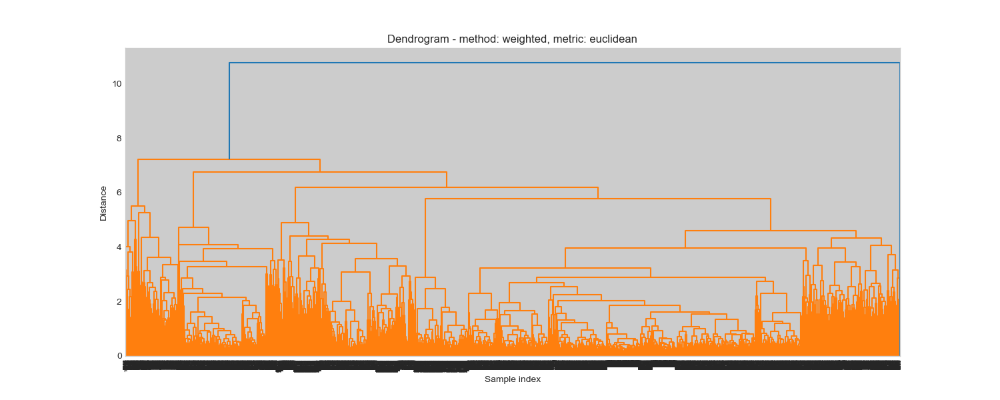

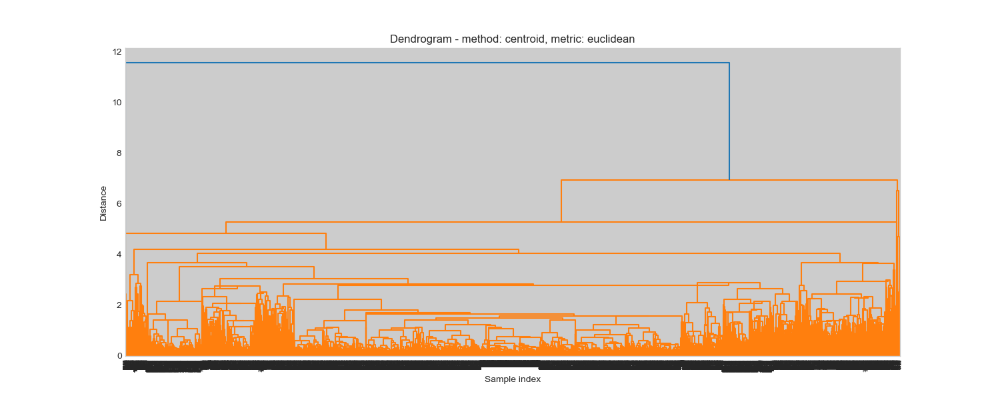

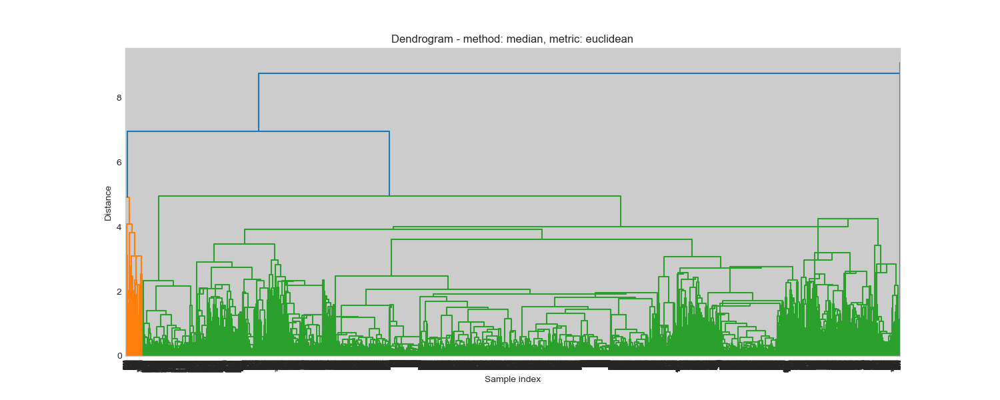

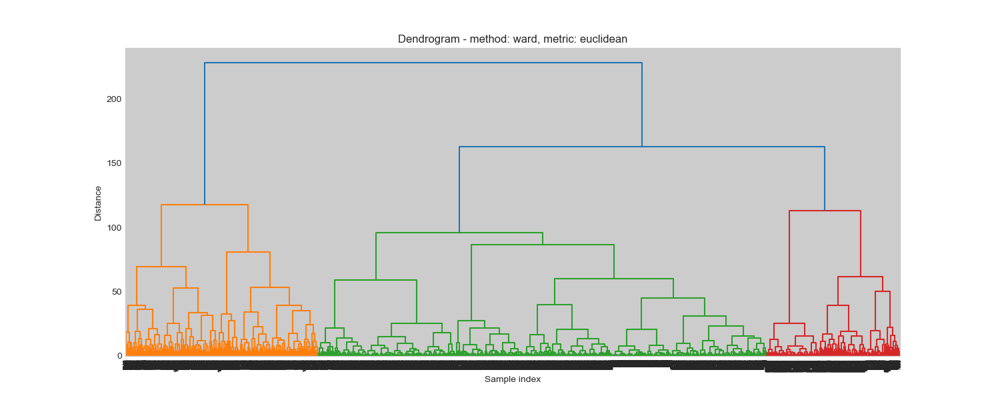

In [39]:
euclidean_res = evaluate_linkage(scaled_data_df_30s, "euclidean", linkage_methods)

In [40]:
linkage_methods.remove("centroid")
linkage_methods.remove("median")
linkage_methods.remove("ward")

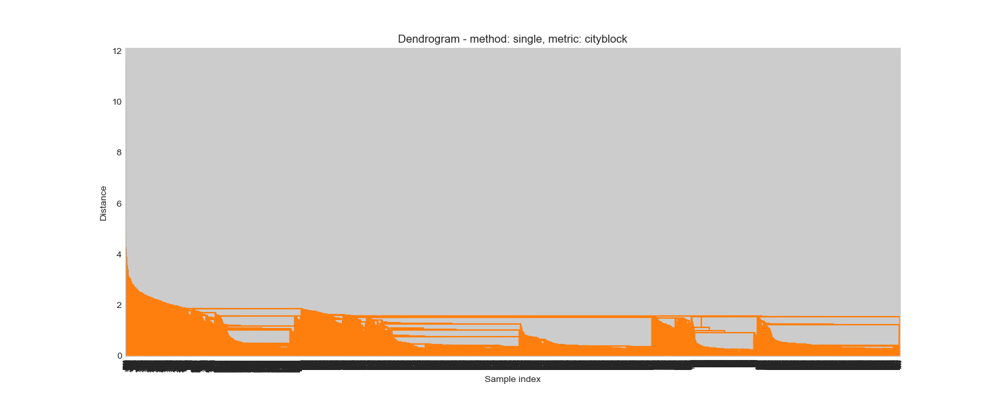

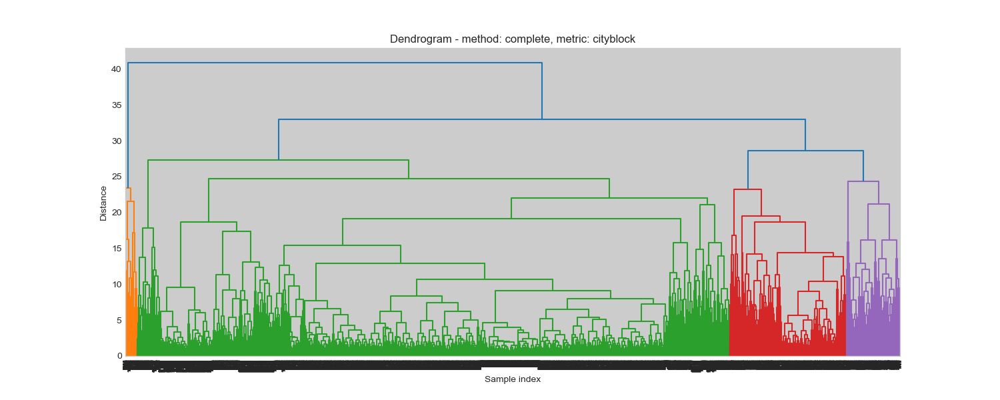

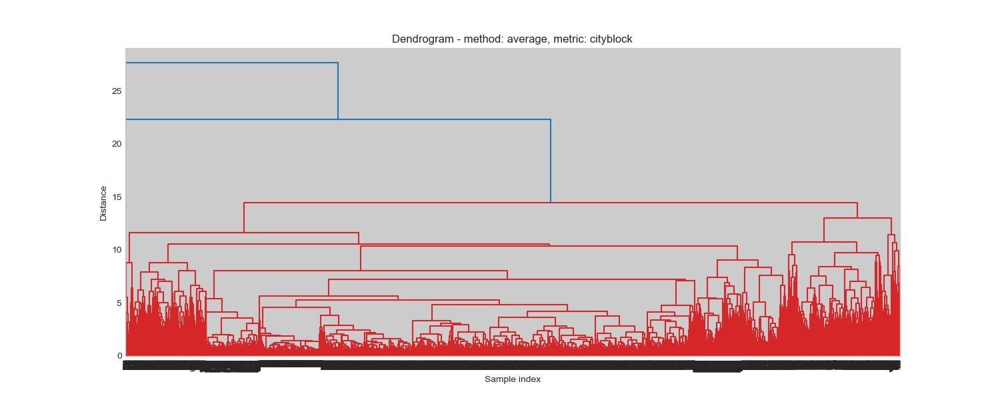

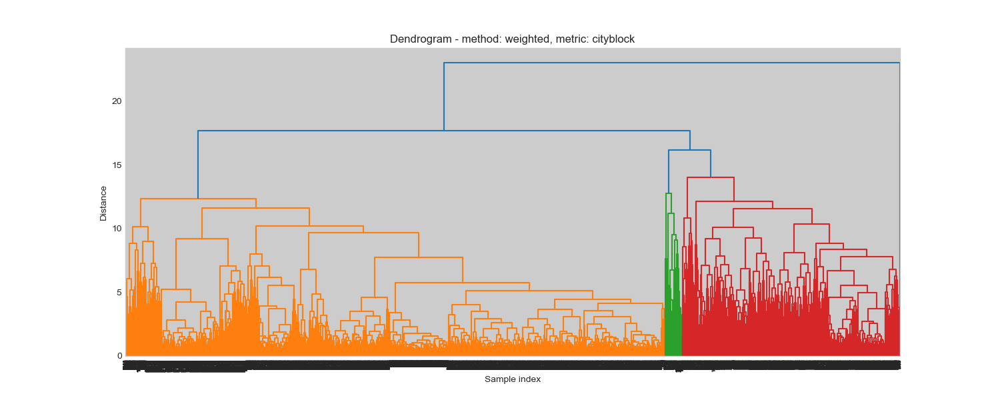

In [41]:
cityblock_res = evaluate_linkage(scaled_data_df_30s, "cityblock", linkage_methods)

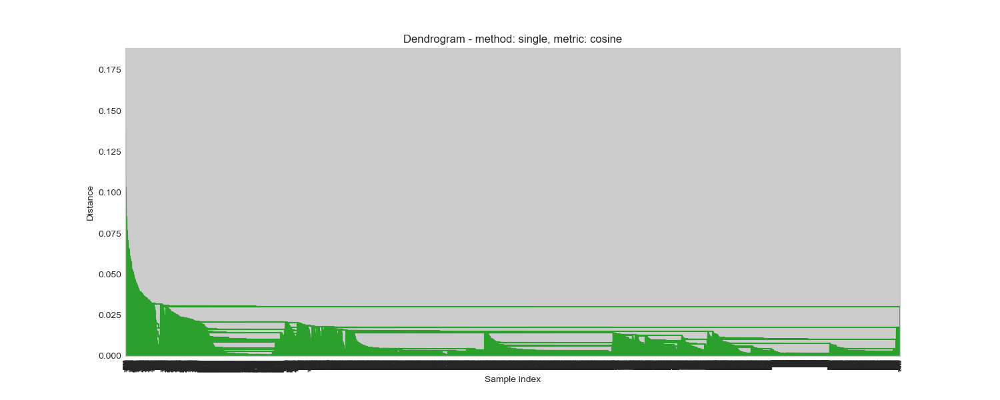

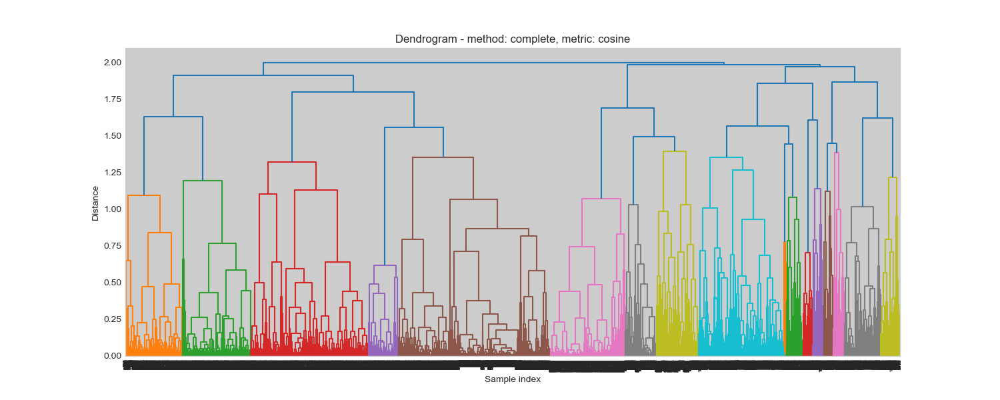

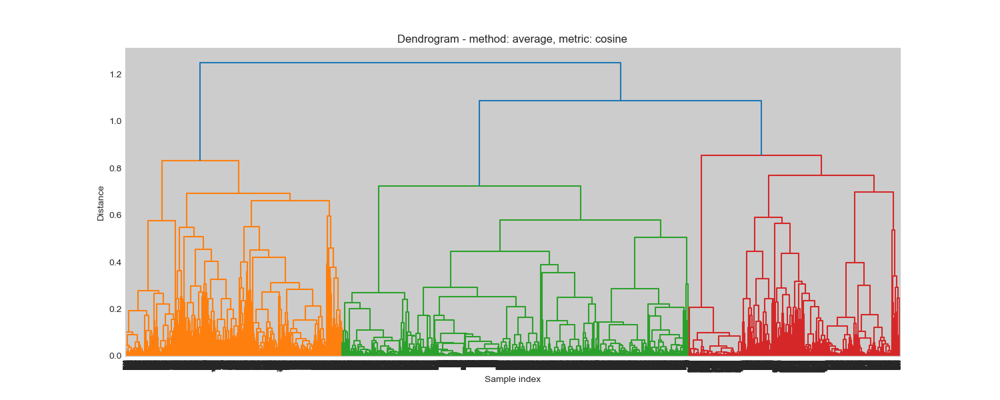

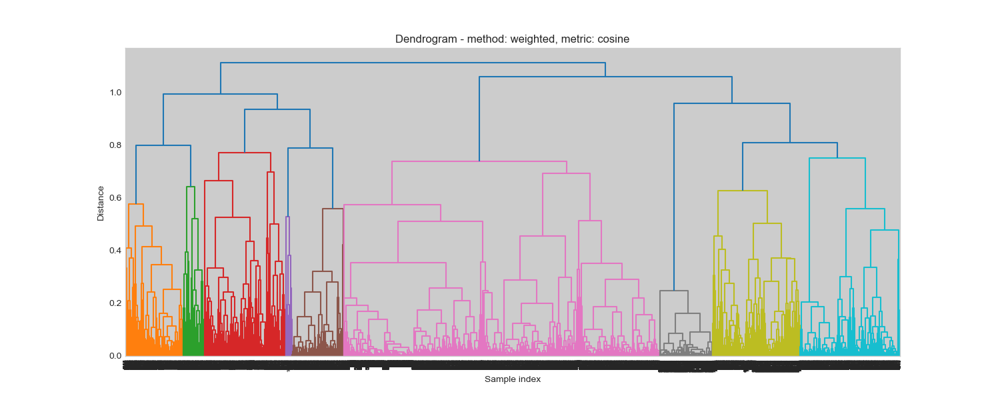

In [42]:
cosine_res = evaluate_linkage(scaled_data_df_30s, "cosine", linkage_methods)

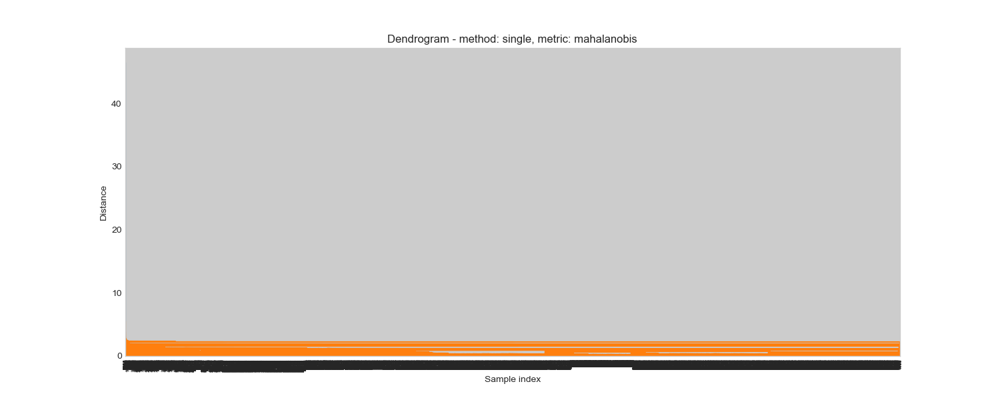

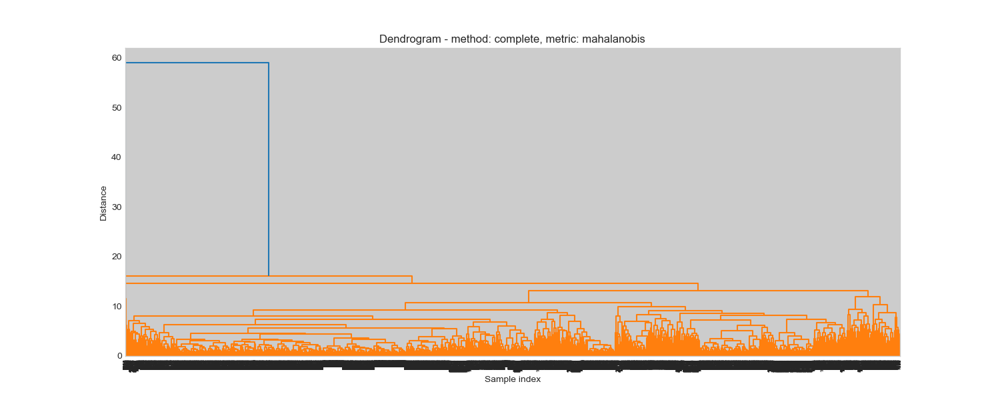

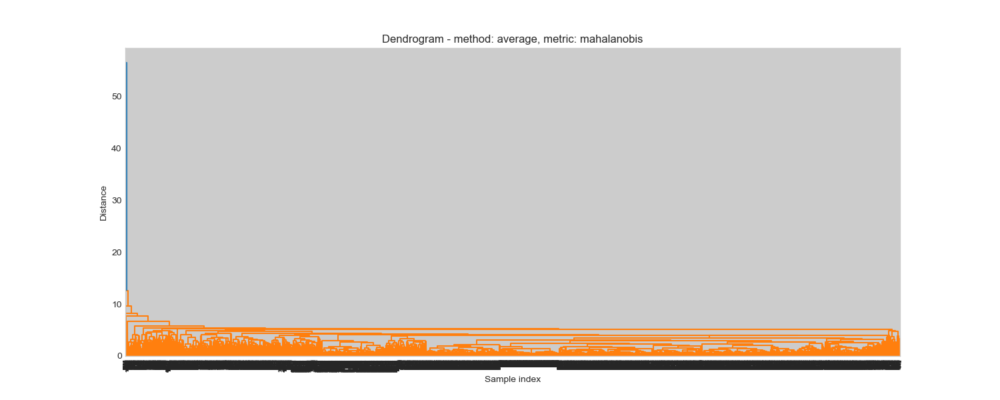

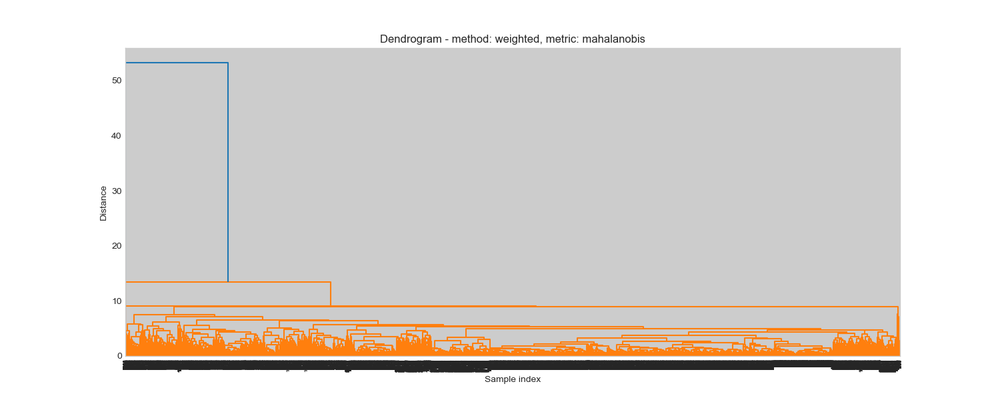

In [43]:
mahalanobis_res = evaluate_linkage(scaled_data_df_30s, "mahalanobis", linkage_methods)

In [44]:
euclidean_res["coph_correlations"]

{'single': 0.6140267019063649,
 'complete': 0.6988740817635607,
 'average': 0.8147850725545775,
 'weighted': 0.5890212242574927,
 'centroid': 0.7956675425111837,
 'median': 0.6523068149573261,
 'ward': 0.7054571153131952}

In [45]:
cityblock_res["coph_correlations"]

{'single': 0.5801034787300716,
 'complete': 0.6714938904589336,
 'average': 0.8192126574061963,
 'weighted': 0.668055288251964}

In [46]:
cosine_res["coph_correlations"]

{'single': 0.2351754945930574,
 'complete': 0.5908876148921887,
 'average': 0.7210526019552347,
 'weighted': 0.6506625103805955}

In [47]:
mahalanobis_res["coph_correlations"]

{'single': 0.6930272990325647,
 'complete': 0.6353459921427725,
 'average': 0.8396967600292128,
 'weighted': 0.7167819810859974}

Najbolji rezultat dobijen je za "cosine" rastojanje, kada se koristi "average" metod.

In [81]:
cosine_res["coph_correlations"]["average"]

0.7210526019552347

In [82]:
best_linkage = cosine_res["linkages"]["average"]

### Četvrti korak - određivanje optimalnog broja klastera

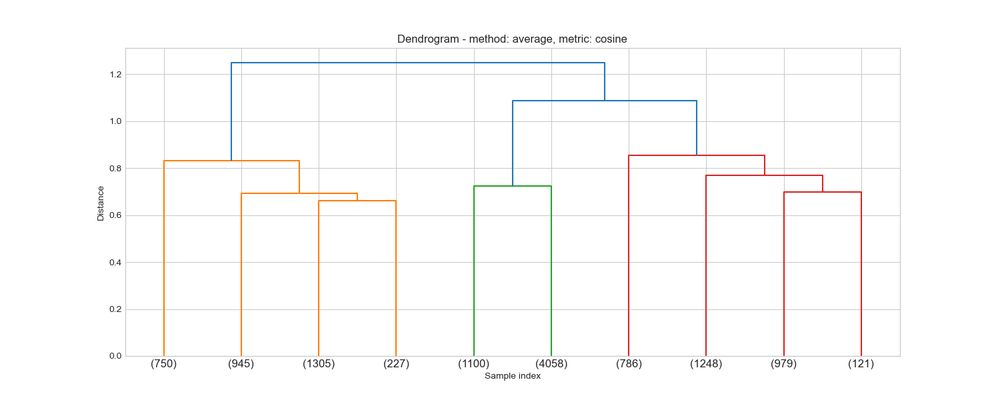

In [83]:
plt.figure(figsize=(15, 6))
dendrogram(best_linkage, truncate_mode="lastp", p=10)
plt.title(f"Dendrogram - method: average, metric: cosine")
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

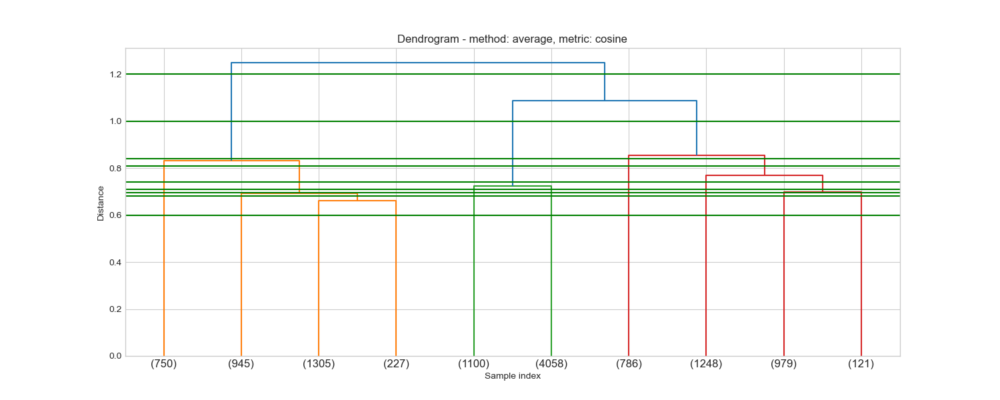

In [104]:
plt.figure(figsize=(15, 6))
dendrogram(best_linkage, truncate_mode="lastp", p=10)
plt.axhline(y=1.2, color='g', linestyle='-')    # 2 clusters
plt.axhline(y=1.0, color='g', linestyle='-')    # 3 clusters
plt.axhline(y=0.84, color='g', linestyle='-')   # 4 clusters
plt.axhline(y=0.81, color='g', linestyle='-')   # 5 clusters
plt.axhline(y=0.74, color='g', linestyle='-')   # 6 clusters
plt.axhline(y=0.71, color='g', linestyle='-')   # 7 clusters
plt.axhline(y=0.695, color='g', linestyle='-')  # 8 clusters
plt.axhline(y=0.68, color='g', linestyle='-')   # 9 clusters
plt.axhline(y=0.6, color='g', linestyle='-')    # 10 clusters
plt.title(f"Dendrogram - method: average, metric: cosine")
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

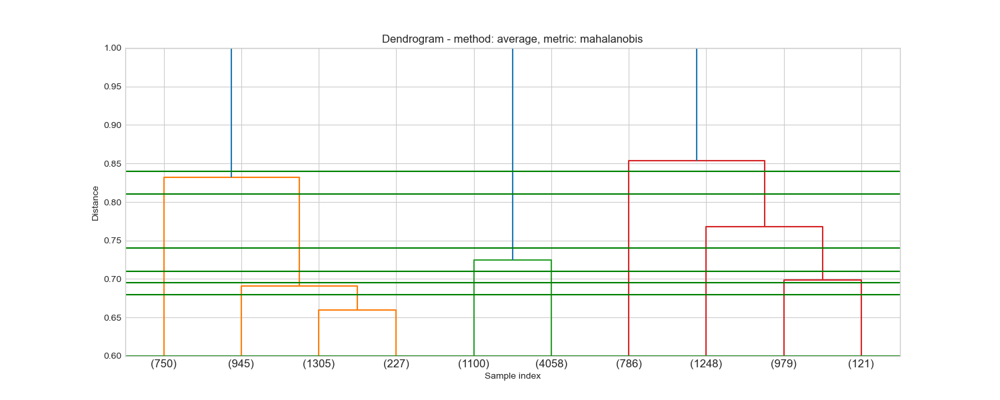

In [103]:
plt.figure(figsize=(15, 6))
dendrogram(best_linkage, truncate_mode="lastp", p=10)
plt.axhline(y=1.2, color='g', linestyle='-')    # 2 clusters
plt.axhline(y=1.0, color='g', linestyle='-')    # 3 clusters
plt.axhline(y=0.84, color='g', linestyle='-')   # 4 clusters
plt.axhline(y=0.81, color='g', linestyle='-')   # 5 clusters
plt.axhline(y=0.74, color='g', linestyle='-')   # 6 clusters
plt.axhline(y=0.71, color='g', linestyle='-')   # 7 clusters
plt.axhline(y=0.695, color='g', linestyle='-')  # 8 clusters
plt.axhline(y=0.68, color='g', linestyle='-')   # 9 clusters
plt.axhline(y=0.6, color='g', linestyle='-')    # 10 clusters
plt.title(f"Dendrogram - method: average, metric: mahalanobis")
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.ylim(0.6, 1.0)
plt.show()

In [105]:
max_distances = [1.2, 1.0, 0.84, 0.81, 0.74, 0.71, 0.695, 0.68, 0.6]

In [106]:
def find_cluster_num(data, max_distances, score):
    number_of_clusters = 2
    scores = {}

    for distance in max_distances:
        clusters = fcluster(best_linkage, distance, criterion="distance")

        if score == "silhouette_score":
            eval_score = silhouette_score(data, clusters)
        if score == "calinski_harabasz_score":
            eval_score = calinski_harabasz_score(data, clusters)
            
        scores[number_of_clusters] = eval_score
        number_of_clusters = number_of_clusters + 1

    return scores

In [107]:
silhouette_scores = find_cluster_num(scaled_data_df_30s, max_distances, "silhouette_score")

In [108]:
silhouette_scores

{2: 0.2907387358066715,
 3: 0.25695512624559524,
 4: 0.2844544296903102,
 5: 0.21749055683714202,
 6: 0.20657868052703066,
 7: 0.21298849067300551,
 8: 0.20391293950742026,
 9: 0.22293272321068092,
 10: 0.22783644481747858}

In [109]:
calinski_harabasz_scores = find_cluster_num(scaled_data_df_30s, max_distances, "calinski_harabasz_score")

In [110]:
calinski_harabasz_scores

{2: 3552.3776788594564,
 3: 3395.705552061221,
 4: 3150.7736184120695,
 5: 2816.4804518951687,
 6: 2611.52188101154,
 7: 2491.8872641843363,
 8: 2186.236552664552,
 9: 2368.2228929143093,
 10: 2269.5883858611096}

Najbolji rezultati dobijaju se za 2, 3 i 4 klastera, a za dalju analizu odabrana su 4 klastera.

### Peti korak - primena i evaluacija algoritma

In [160]:
clusters = fcluster(best_linkage, 0.84, criterion="distance")
data_30s["Cluster"] = clusters

In [167]:
def evaluate_clusters(features, clusters):
    sil_score = silhouette_score(features, clusters).round(2)
    ch_score = calinski_harabasz_score(features, clusters).round(2)
    db_score = davies_bouldin_score(features, clusters).round(2)

    print("Silhouette score: " + str(sil_score))
    print("Calinski-Harabasz score: " + str(ch_score))
    print("Davies-Bouldin score: " + str(db_score))

In [168]:
evaluate_clusters(scaled_data_df_30s, clusters)

Silhouette score: 0.28
Calinski-Harabasz score: 3150.77
Davies-Bouldin score: 1.3


In [162]:
data_30s["Cluster"].value_counts()

Cluster
2    5158
1    3227
4    2348
3     786
Name: count, dtype: int64

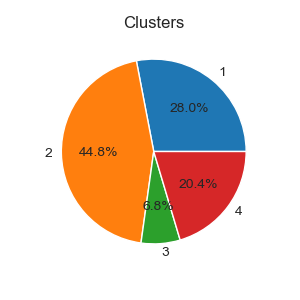

In [163]:
plt.figure(figsize=(3, 3))
plt.title("Clusters")
data_30s.groupby("Cluster").size().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [173]:
def visualize_clusters(features, clusters):
    fig = plt.figure(figsize=(15, 5))

    pca_2d = PCA(n_components=2)
    pcs = pca_2d.fit_transform(features)
    pc1_values_2d = pcs[:, 0]
    pc2_values_2d = pcs[:, 1]
   
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.set_xlabel("PC1")
    ax1.set_ylabel("PC2")
    ax1.set_title("2D visualization")
    palette = sns.color_palette("bright", n_colors=len(set(clusters)))  
    sns.scatterplot(x=pc1_values_2d, y=pc2_values_2d, hue=clusters, palette=palette, alpha=0.8, legend='full')

    pca_3d = PCA(n_components=3)
    pcs = pca_3d.fit_transform(features)
    pc1_values_3d = pcs[:, 0]
    pc2_values_3d = pcs[:, 1]
    pc3_values_3d = pcs[:, 2]

    ax2 = fig.add_subplot(1, 2, 2, projection="3d", elev=48, azim=134)
    ax2.set_xlabel("PC1")
    ax2.set_ylabel("PC2")
    ax2.set_zlabel("PC3")
    ax2.set_title("3D visualization")
    cmap = ListedColormap(palette)
    ax2.scatter3D(pc1_values_3d, pc2_values_3d, pc3_values_3d, c=clusters, cmap=cmap)

    plt.tight_layout()

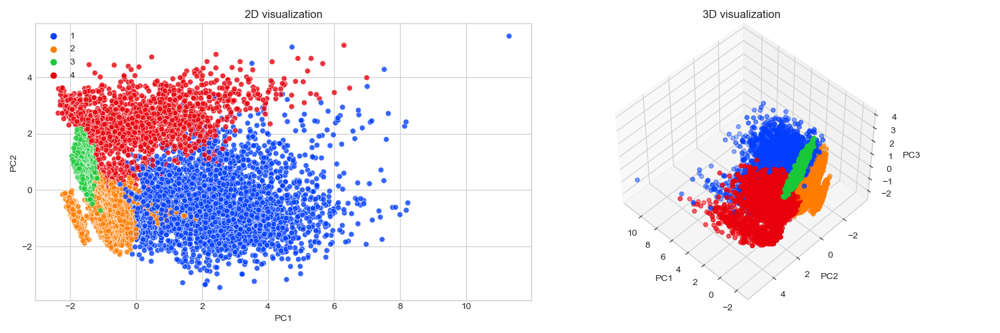

In [174]:
visualize_clusters(scaled_data_df_30s, clusters)

In [155]:
def do_lasso(X, clusters, columns):
    lasso = LassoCV(cv=5, random_state=42)
    lasso.fit(X, clusters)
    
    coef = pd.Series(lasso.coef_, index = columns)
    imp_coef = coef.sort_values()
    
    plt.figure(figsize=(12, 5))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using Lasso Model")
    plt.show()

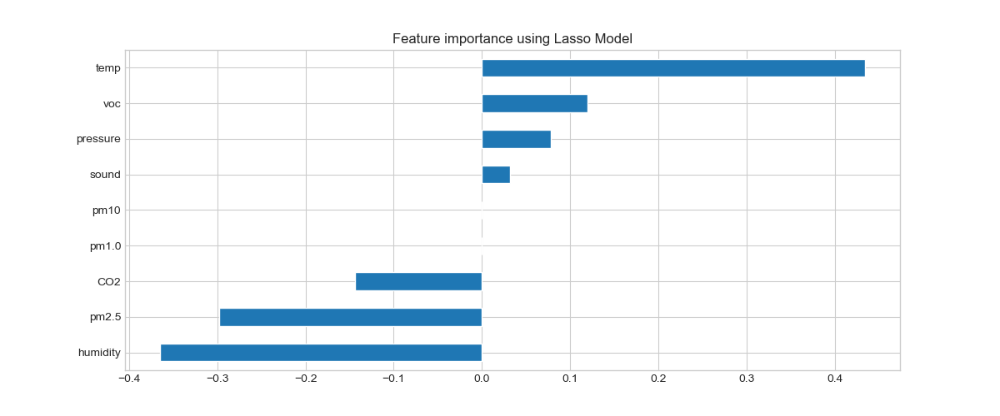

In [158]:
do_lasso(scaled_data_df_30s, clusters, list(scaled_data_df_30s.columns))

In [125]:
features = list(data_30s.columns)
features.remove('Cluster')

In [127]:
data_30s.groupby('Cluster')[features].mean().T

Cluster_4,1,2,3,4
sound,0.906517,1.001998,1.140240,1.242064
pressure,1014.662991,1013.761669,1022.330184,1014.792406
temp,24.703590,24.476382,26.323044,26.715729
humidity,36.774753,34.909901,33.507270,31.475849
voc,31228.977456,29895.408007,29459.986641,31243.465077
pm1.0,78.540130,33.404226,32.347964,53.139055
pm2.5,105.647505,48.764541,46.923664,69.019804
pm10,116.045398,60.869232,58.642494,79.213373
CO2,461.272849,439.651045,449.864504,420.797686


Klaster 1: Povećana vlažnost, značajno povećana koncentracija PM čestica, značajno povećana koncentracija CO2, blago povecana koncetracija voc

Klaster 2: Normalno stanje sa prosečnim vrednostima parametara.

Klaster 3: Povišena temperatura, povećan pritisak

Klaster 4: Povišena temperatura, smanjena vlažnost, blago povećana koncentracija PM čestica, smanjena koncentracija CO2, blago povecana koncetracija voc, povećana buka

In [175]:
result = pd.DataFrame()
result["timestamp"] = data_30s.index
result["cluster"] = clusters

In [176]:
result.head()

,timestamp,cluster
0,2022-11-07 00:00:30,2
1,2022-11-07 00:01:00,2
2,2022-11-07 00:01:30,2
3,2022-11-07 00:02:00,2
4,2022-11-07 00:02:30,2


In [177]:
result.to_csv('result.csv', index=False)